In [1]:
# Download the same test files from the Cats vs Dogs ungraded lab
!wget -O cat1.jpg https://storage.googleapis.com/tensorflow-1-public/tensorflow-3-temp/MLColabImages/cat1.jpeg
!wget -O cat2.jpg https://storage.googleapis.com/tensorflow-1-public/tensorflow-3-temp/MLColabImages/cat2.jpeg
!wget -O catanddog.jpg https://storage.googleapis.com/tensorflow-1-public/tensorflow-3-temp/MLColabImages/catanddog.jpeg
!wget -O dog1.jpg https://storage.googleapis.com/tensorflow-1-public/tensorflow-3-temp/MLColabImages/dog1.jpeg
!wget -O dog2.jpg https://storage.googleapis.com/tensorflow-1-public/tensorflow-3-temp/MLColabImages/dog2.jpeg

# Download prepared weights
!wget --no-check-certificate 'https://docs.google.com/uc?export=download&id=1kipXTxesGJKGY1B8uSPRvxROgOH90fih' -O 0_epochs.h5
!wget --no-check-certificate 'https://docs.google.com/uc?export=download&id=1oiV6tjy5k7h9OHGTQaf0Ohn3FmF-uOs1' -O 15_epochs.h5


--2026-08-02 14:58:31--  https://storage.googleapis.com/tensorflow-1-public/tensorflow-3-temp/MLColabImages/cat1.jpeg
Resolving storage.googleapis.com (storage.googleapis.com)... 34.153.2.27, 104.154.125.27, 34.144.171.27, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|34.153.2.27|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 414826 (405K) [image/jpeg]
Saving to: ‘cat1.jpg’

cat1.jpg            100%[===================>] 405.10K   530KB/s    in 0.8s    

2026-08-02 14:58:32 (530 KB/s) - ‘cat1.jpg’ saved [414826/414826]

--2026-08-02 14:58:33--  https://storage.googleapis.com/tensorflow-1-public/tensorflow-3-temp/MLColabImages/cat2.jpeg
Resolving storage.googleapis.com (storage.googleapis.com)... 34.153.2.27, 104.154.125.27, 34.144.171.27, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|34.153.2.27|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 599639 (586K) [image/jpeg]
Saving to: ‘cat2.jpg’

ca

In [ ]:
!pip install --upgrade "protobuf>=6.31.1"

In [1]:
import tensorflow_datasets as tfds
import tensorflow as tf
import keras
from keras.models import Sequential,Model
from keras.layers import Dense,Conv2D,Flatten,MaxPooling2D,GlobalAveragePooling2D
import numpy as np
import matplotlib.pyplot as plt
import scipy as sp
import cv2

In [2]:
train_data = tfds.load('cats_vs_dogs', split='train[:80%]', as_supervised=True)
validation_data = tfds.load('cats_vs_dogs', split='train[-20%:]', as_supervised=True)

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Generating splits...:   0%|          | 0/1 [00:00<?, ? splits/s]

Generating train examples...: 0 examples [00:00, ? examples/s]

Shuffling /root/tensorflow_datasets/cats_vs_dogs/incomplete.M12L0T_4.0.1/cats_vs_dogs-train.tfrecord-[0-9][0-9…

Dataset cats_vs_dogs downloaded and prepared to /root/tensorflow_datasets/cats_vs_dogs/4.0.1. Subsequent calls will reuse this data.


In [3]:
def augmentimages(image, label):
  image = tf.cast(image, tf.float32)
  image = (image/255)
  image = tf.image.resize(image, (300, 300))
  return image, label

In [40]:
train_dataset = train_data.map(augmentimages, num_parallel_calls=tf.data.AUTOTUNE).shuffle(1024).batch(32).prefetch(tf.data.AUTOTUNE)
valid_dataset = validation_data.map(augmentimages).batch(32).prefetch(tf.data.AUTOTUNE)

Build Classifier

In [31]:
def classifier(input_shape):
  model = Sequential()
  model.add(keras.Input(input_shape))
  model.add(Conv2D(16,(3,3),activation='relu', padding='same'))
  model.add(MaxPooling2D(2,2))
  model.add(Conv2D(32,(3,3),activation='relu', padding='same'))
  model.add(MaxPooling2D(2,2))
  model.add(Conv2D(64, kernel_size=(3,3), activation='relu', padding='same'))
  model.add(MaxPooling2D(2,2))
  model.add(Conv2D(128, kernel_size=(3,3), activation='relu', padding='same'))
  model.add(GlobalAveragePooling2D())
  model.add(Dense(2, activation='sigmoid'))
  return model
model = classifier((300,300,3))
model.summary()

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_12 (Conv2D)              │ (None, 300, 300, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_9 (MaxPooling2D)  │ (None, 150, 150, 16)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_13 (Conv2D)              │ (None, 150, 150, 32)   │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_10 (MaxPooling2D) │ (None, 75, 75, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_14 (Conv2D)              │ (None, 75, 75, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_11 (MaxPooling2D) │ (None, 37, 37, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_15 (Conv2D)              │ (None, 37, 37, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_3      │ (None, 128)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 2)              │           258 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 97,698 (381.63 KB)

 Trainable params: 97,698 (381.63 KB)

 Non-trainable params: 0 (0.00 B)

In [28]:
def do_salience(image, model, label, prefix):
  '''
  Generates the saliency map of a given image.

  Args:
    image (file) -- picture that the model will classify
    model (keras Model) -- your cats and dogs classifier
    label (int) -- ground truth label of the image
    prefix (string) -- prefix to add to the filename of the saliency map
  '''

  # Read the image and convert channel order from BGR to RGB
  img = cv2.imread(image)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

  # Resize the image to 300 x 300 and normalize pixel values to the range [0, 1]
  img = cv2.resize(img, (300, 300)) / 255.0


  # Add an additional dimension (for the batch), and save this in a new variable
  img_exp = np.expand_dims(img, axis=0)


  # Declare the number of classes
  num_classes = 2


  # Define the expected output array by one-hot encoding the label
  # The length of the array is equal to the number of classes
  expected_out = tf.one_hot([label], num_classes)


  # Witin the GradientTape block:
  # Cast the image as a tf.float32
  # Use the tape to watch the float32 image
  # Get the model's prediction by passing in the float32 image
  # Compute an appropriate loss
  # between the expected output and model predictions.
  # you may want to print the predictions to see if the probabilities adds up to 1
  with tf.GradientTape() as tape:
    img_exp = tf.cast(img_exp, tf.float32)
    tape.watch(img_exp)
    predictions = model(img_exp)
    loss = tf.keras.losses.categorical_crossentropy(expected_out, predictions)

  gradients = tape.gradient(loss, img_exp)

  # generate the grayscale tensor
  grayscale_tensor = tf.reduce_sum(tf.abs(gradients), axis=-1)

  # normalize the pixel values to be in the range [0, 255].
  # the max value in the grayscale tensor will be pushed to 255.
  # the min value will be pushed to 0.
  # Use the formula: 255 * (x - min) / (max - min)
  # Use tf.reduce_max, tf.reduce_min
  # Cast the tensor as a tf.uint8
  normalized_tensor = tf.cast(
    255
    * (grayscale_tensor - tf.reduce_min(grayscale_tensor))
    / (tf.reduce_max(grayscale_tensor) - tf.reduce_min(grayscale_tensor)),
    tf.uint8,
  )
  # Remove dimensions that are size 1
  normalized_tensor = tf.squeeze(normalized_tensor)


  # plot the normalized tensor
  # Set the figure size to 8 by 8
  # do not display the axis
  # use the 'gray' colormap
  # This code is provided for you.
  plt.figure(figsize=(8, 8))
  plt.axis('off')
  plt.imshow(normalized_tensor, cmap='gray')
  plt.show()

  # optional: superimpose the saliency map with the original image, then display it.
  # we encourage you to do this to visualize your results better

  gradient_color = cv2.applyColorMap(normalized_tensor.numpy(), cv2.COLORMAP_HOT)
  gradient_color = gradient_color / 255.0
  super_imposed = cv2.addWeighted(img, 0.5, gradient_color, 0.5, 0.0)

  plt.figure(figsize=(8, 8))
  plt.imshow(super_imposed)
  plt.axis('off')
  plt.show()


  # save the normalized tensor image to a file. this is already provided for you.
  salient_image_name = prefix + image
  normalized_tensor = tf.expand_dims(normalized_tensor, -1)
  normalized_tensor = tf.io.encode_jpeg(normalized_tensor, quality=100, format='grayscale')
  writer = tf.io.write_file(salient_image_name, normalized_tensor)

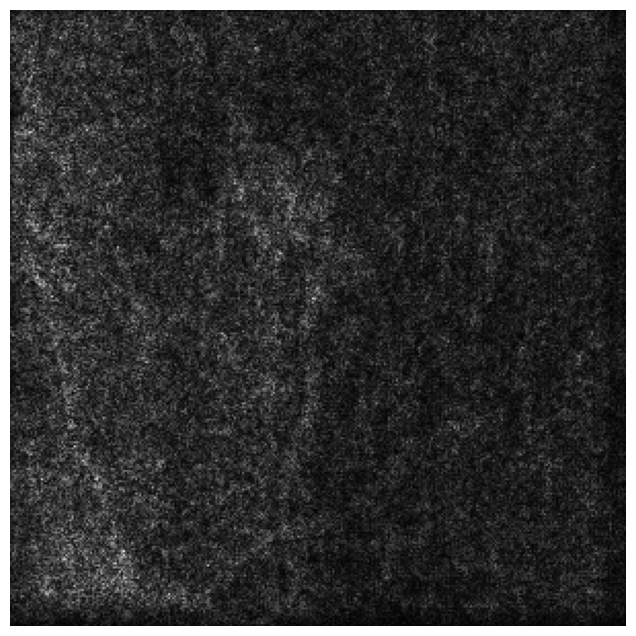

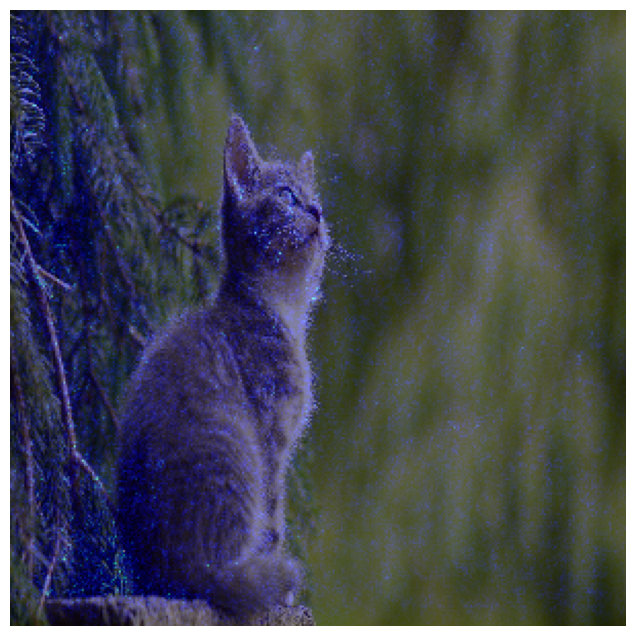

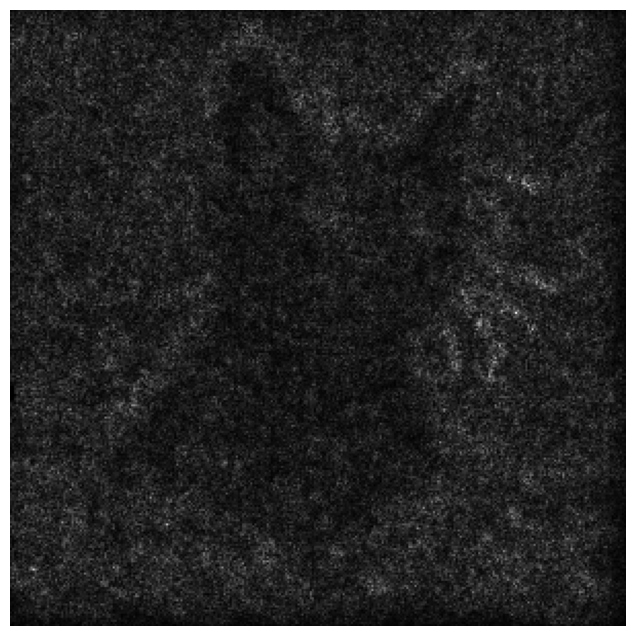

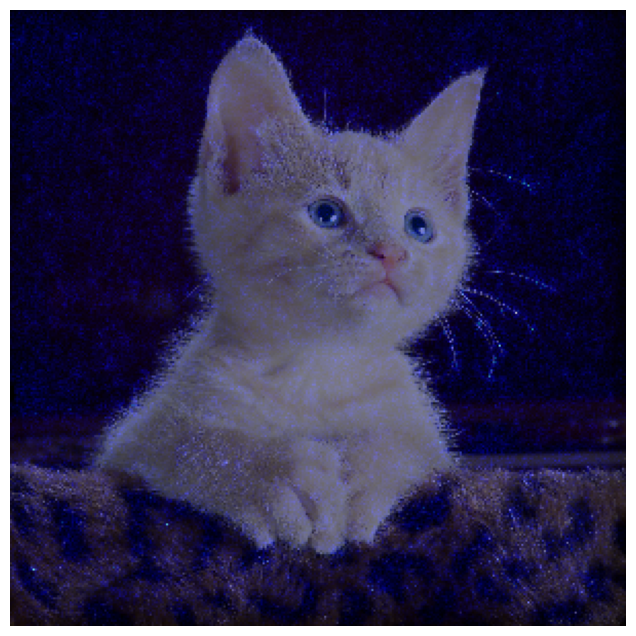

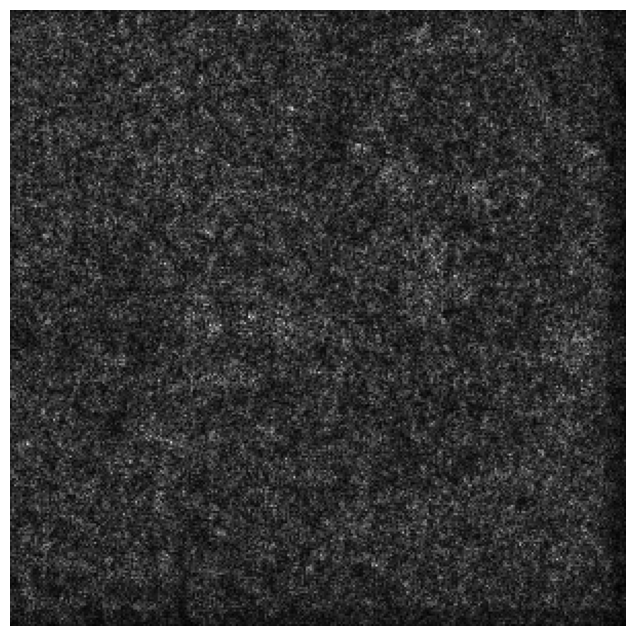

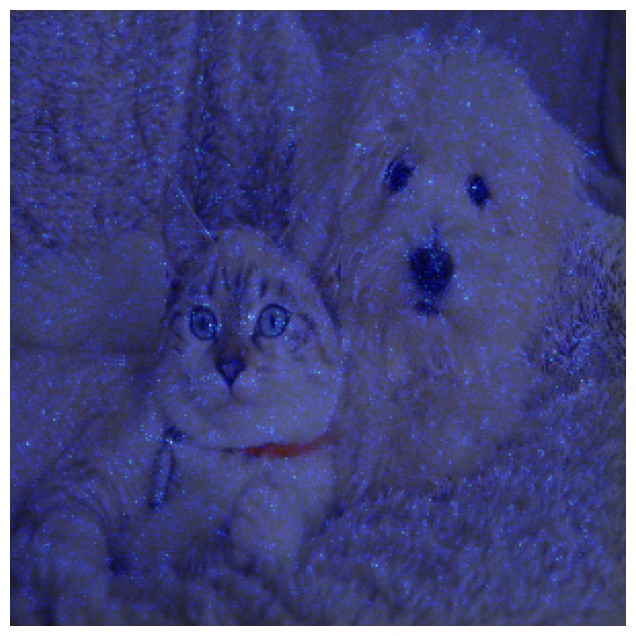

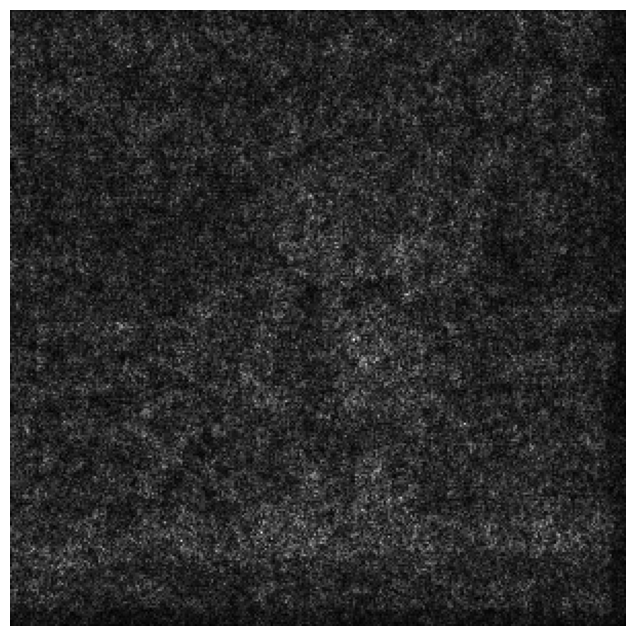

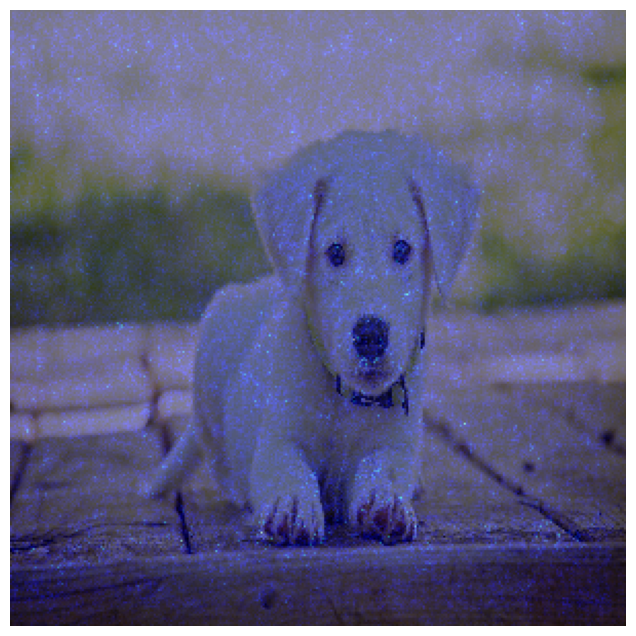

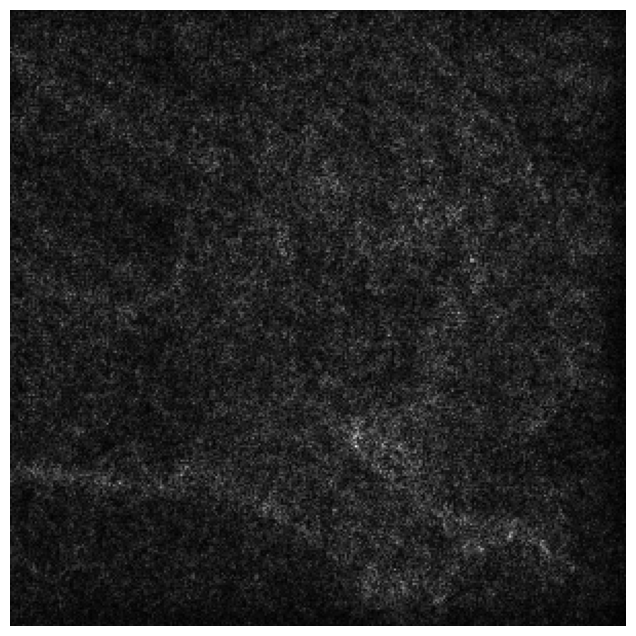

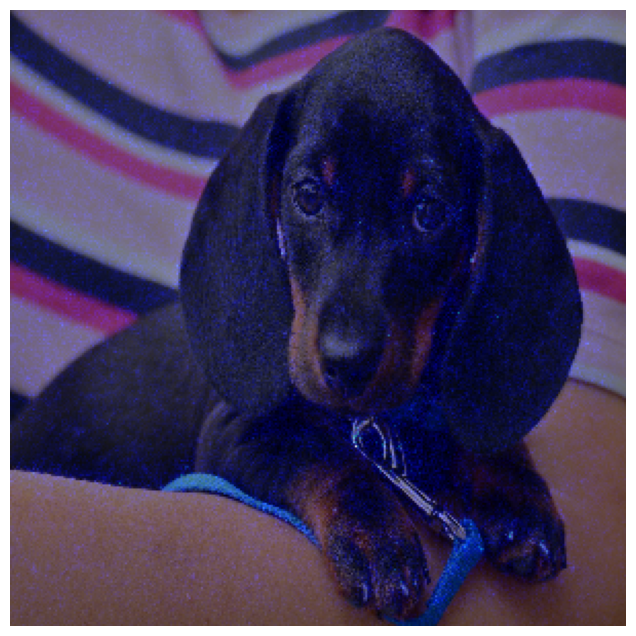

In [29]:
model.load_weights('0_epochs.h5')

test_images = ['cat1.jpg', 'cat2.jpg', 'catanddog.jpg', 'dog1.jpg', 'dog2.jpg']
test_labels = [0, 0, 0, 1, 1]
for i in range(len(test_images)):
  do_salience(test_images[i], model, test_labels[i], 'epoch0_salient')

In [54]:
model.compile(loss='sparse_categorical_crossentropy',metrics=['accuracy'],optimizer=tf.keras.optimizers.RMSprop(learning_rate=0.001))

In [55]:
model.load_weights('15_epochs.h5')
model.fit(train_dataset, validation_data=valid_dataset,epochs=4)

Epoch 1/4
582/582 ━━━━━━━━━━━━━━━━━━━━ 57s 88ms/step - accuracy: 0.8019 - loss: 0.4435 - val_accuracy: 0.8052 - val_loss: 0.4501
Epoch 2/4
582/582 ━━━━━━━━━━━━━━━━━━━━ 52s 86ms/step - accuracy: 0.8067 - loss: 0.4358 - val_accuracy: 0.7603 - val_loss: 0.5052
Epoch 3/4
582/582 ━━━━━━━━━━━━━━━━━━━━ 52s 86ms/step - accuracy: 0.8117 - loss: 0.4273 - val_accuracy: 0.8173 - val_loss: 0.4241
Epoch 4/4
582/582 ━━━━━━━━━━━━━━━━━━━━ 85s 92ms/step - accuracy: 0.8192 - loss: 0.4123 - val_accuracy: 0.8265 - val_loss: 0.3994


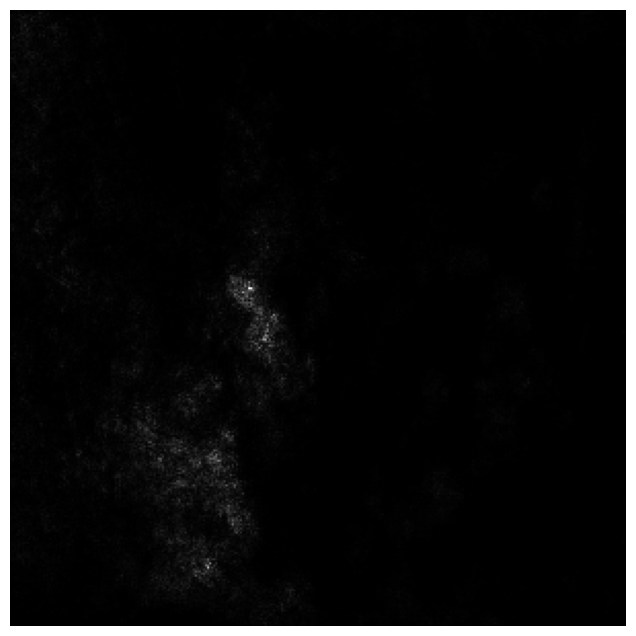

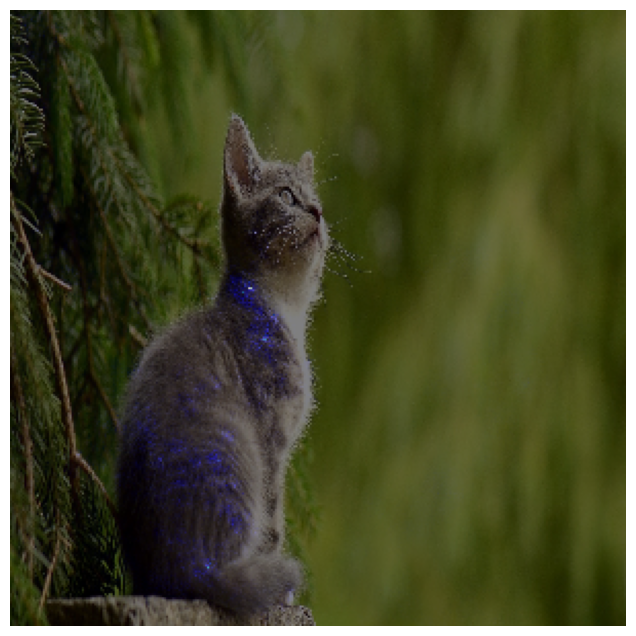

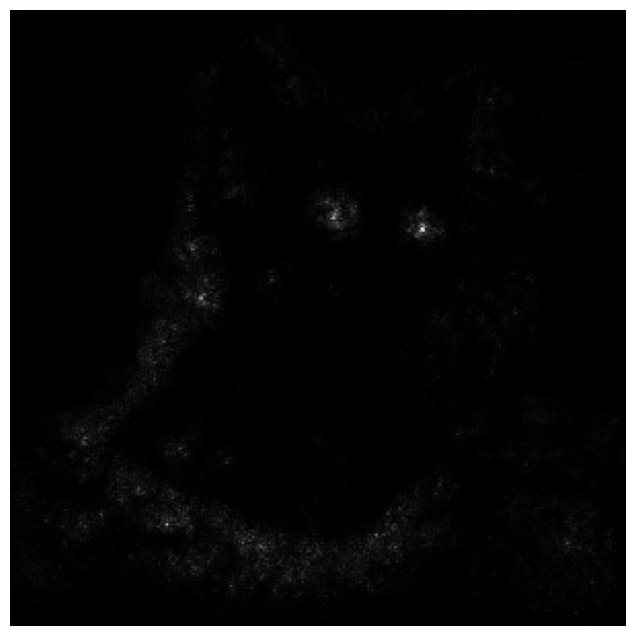

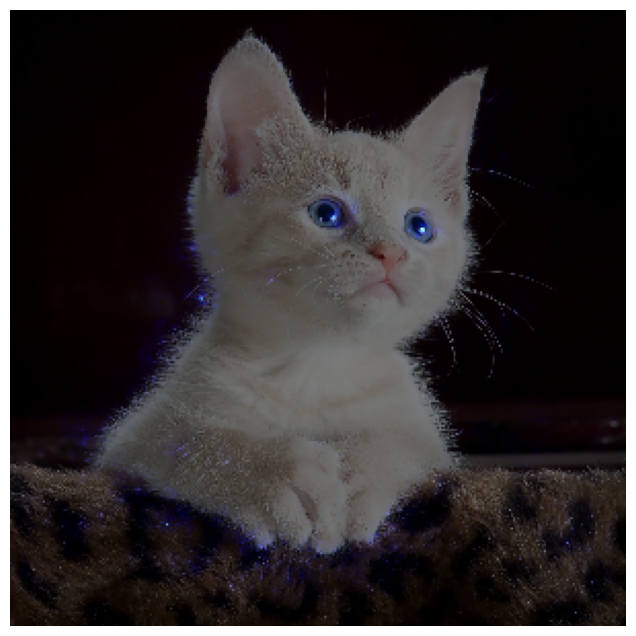

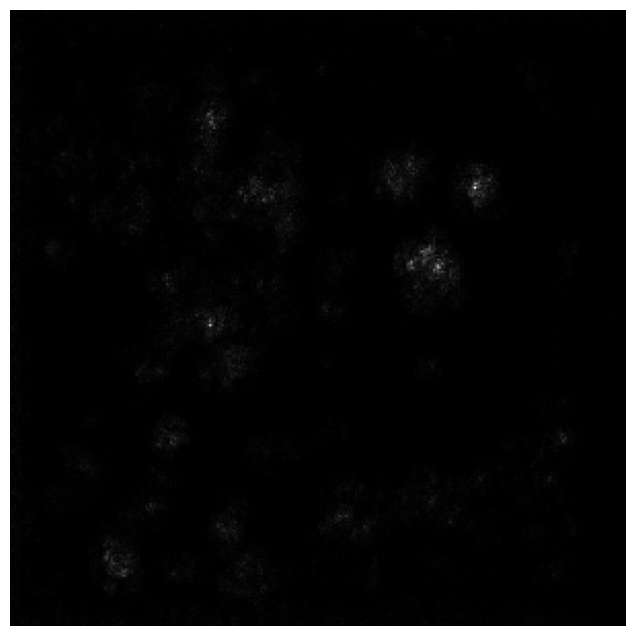

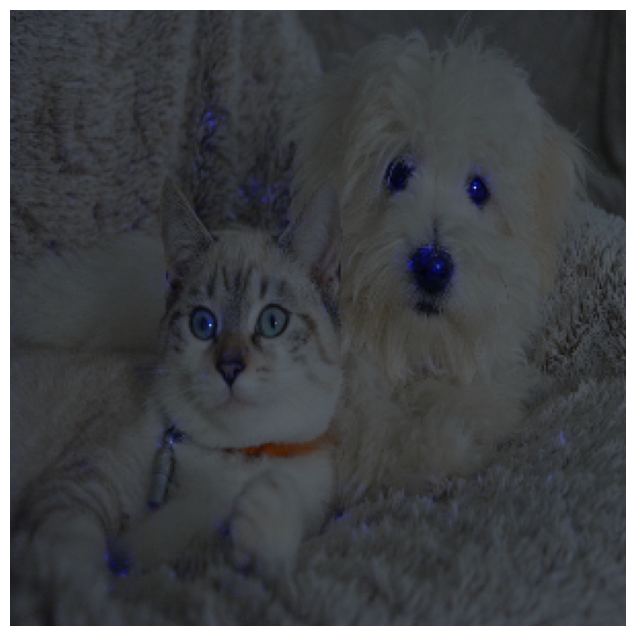

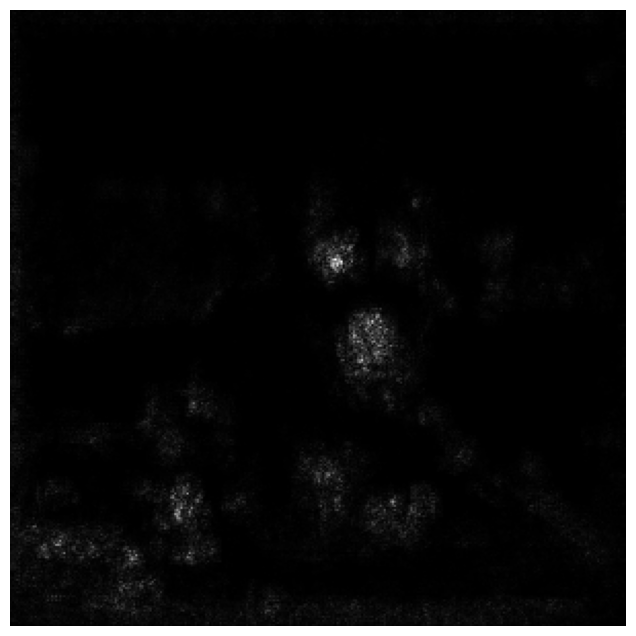

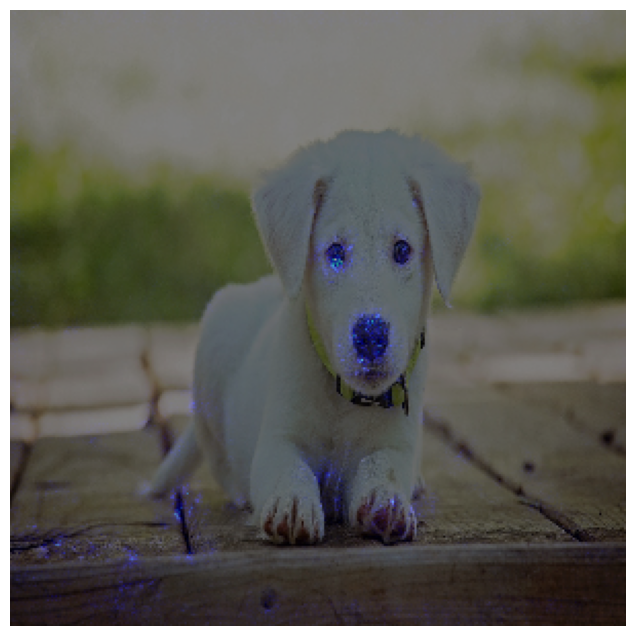

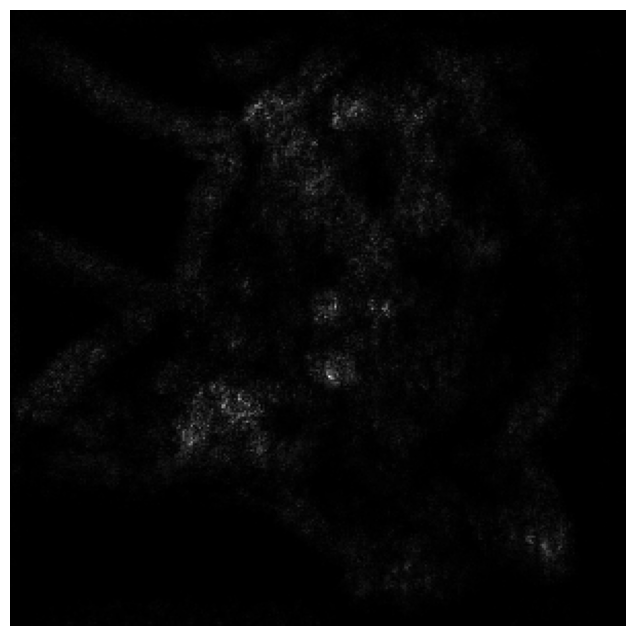

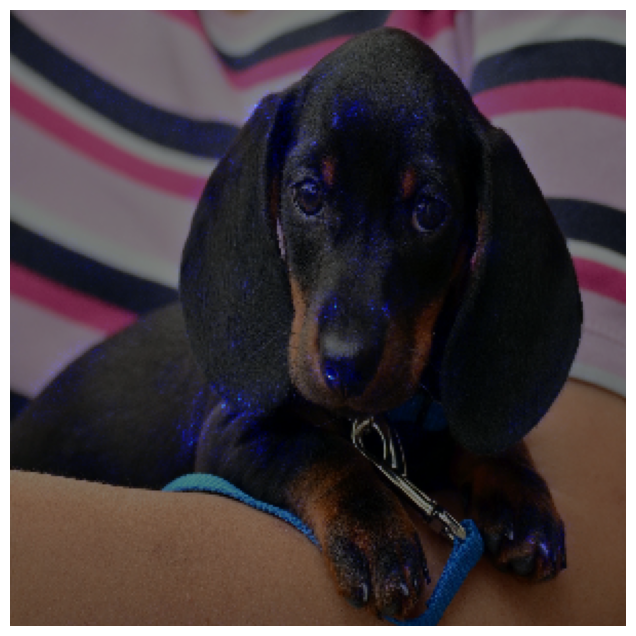

In [56]:
for i in range(len(test_images)):
  do_salience(test_images[i], model, test_labels[i], 'salient')

Zipping the files

In [57]:
from zipfile import ZipFile

!rm images.zip

filenames = ['cat1.jpg', 'cat2.jpg', 'catanddog.jpg', 'dog1.jpg', 'dog2.jpg']

# writing files to a zipfile
with ZipFile('images.zip','w') as zip:
  for file in filenames:
    zip.write('salient' + file)

print("images.zip generated!")

rm: cannot remove 'images.zip': No such file or directory
images.zip generated!


--2026-08-02 17:47:23--  https://docs.google.com/uc?export=download&id=14vFpBJsL_TNQeugX8vUTv8dYZxn__fQY
Resolving docs.google.com (docs.google.com)... 172.217.194.113, 172.217.194.100, 172.217.194.138, ...
Connecting to docs.google.com (docs.google.com)|172.217.194.113|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://drive.usercontent.google.com/download?id=14vFpBJsL_TNQeugX8vUTv8dYZxn__fQY&export=download [following]
--2026-08-02 17:47:24--  https://drive.usercontent.google.com/download?id=14vFpBJsL_TNQeugX8vUTv8dYZxn__fQY&export=download
Resolving drive.usercontent.google.com (drive.usercontent.google.com)... 172.253.158.132, 2404:6800:4003:c26::84
Connecting to drive.usercontent.google.com (drive.usercontent.google.com)|172.253.158.132|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 414488 (405K) [application/octet-stream]
Saving to: ‘95_epochs.h5’

95_epochs.h5        100%[===================>] 404.77K  --.-KB/s  

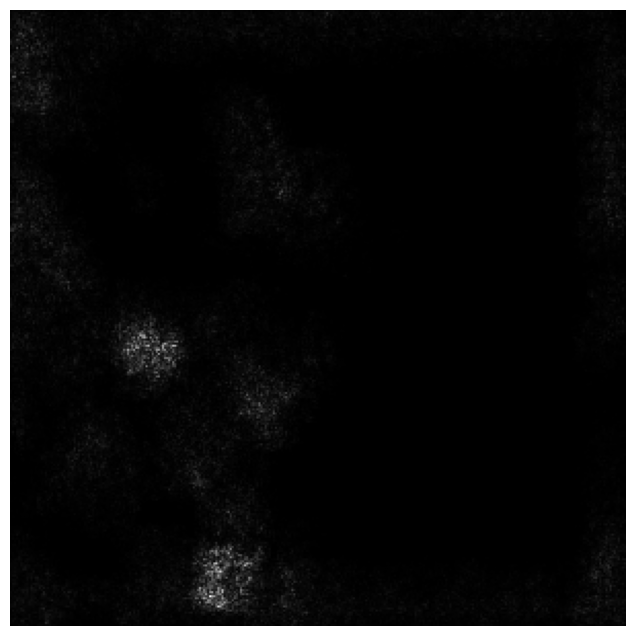

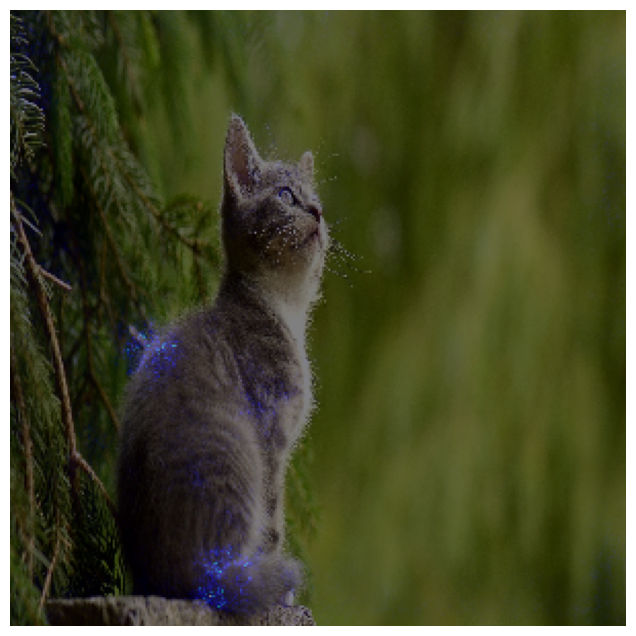

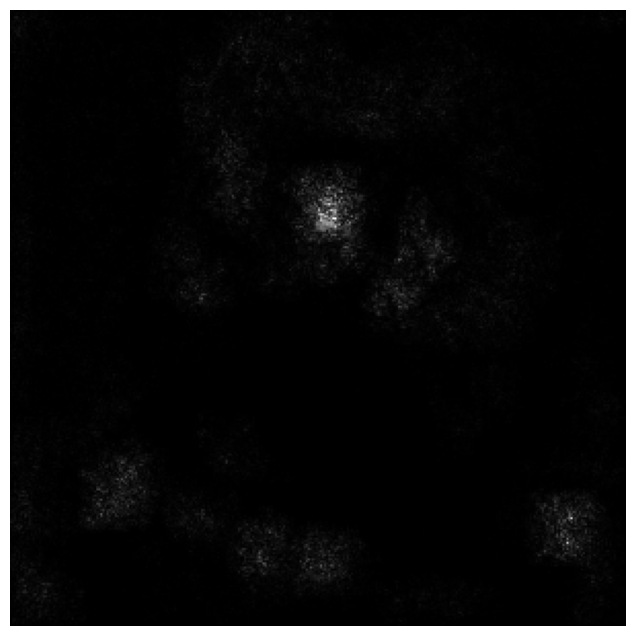

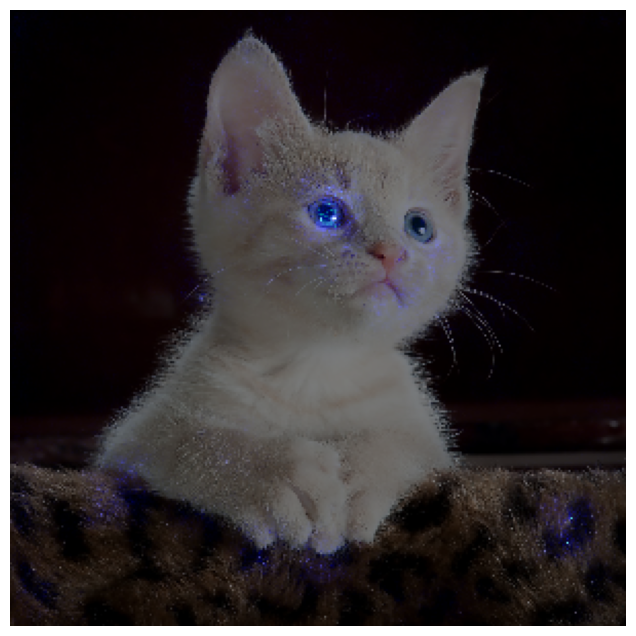

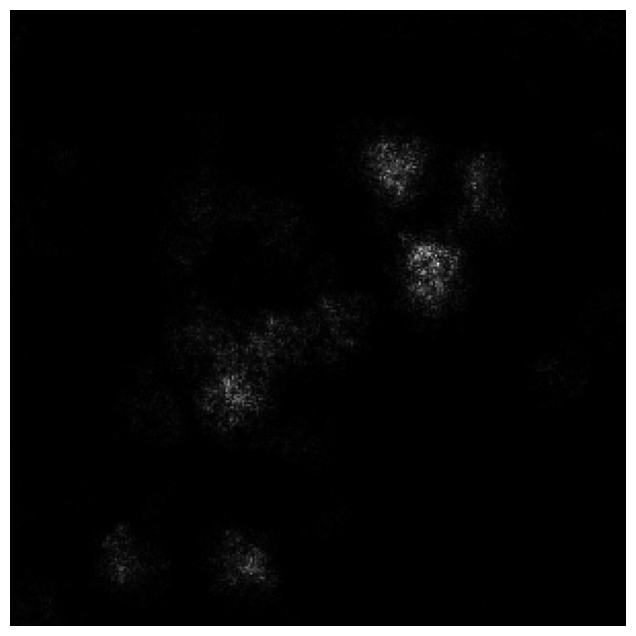

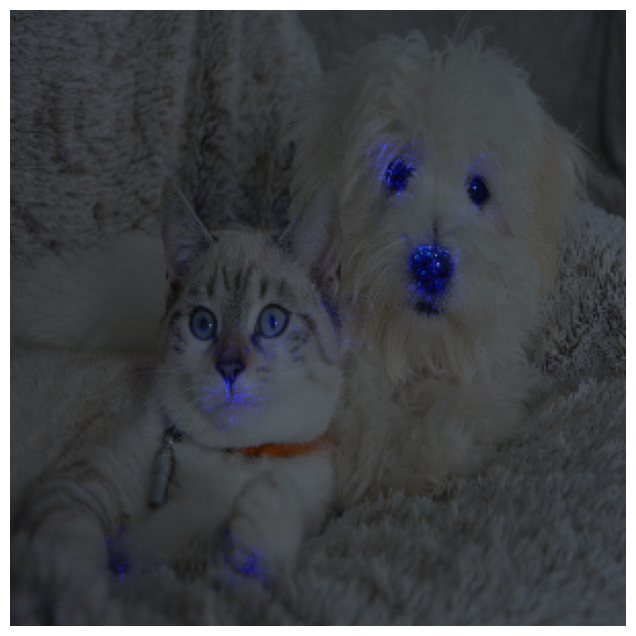

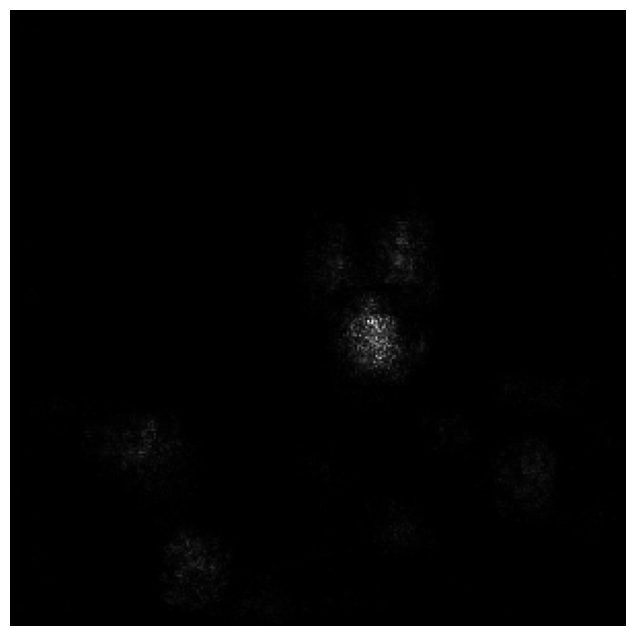

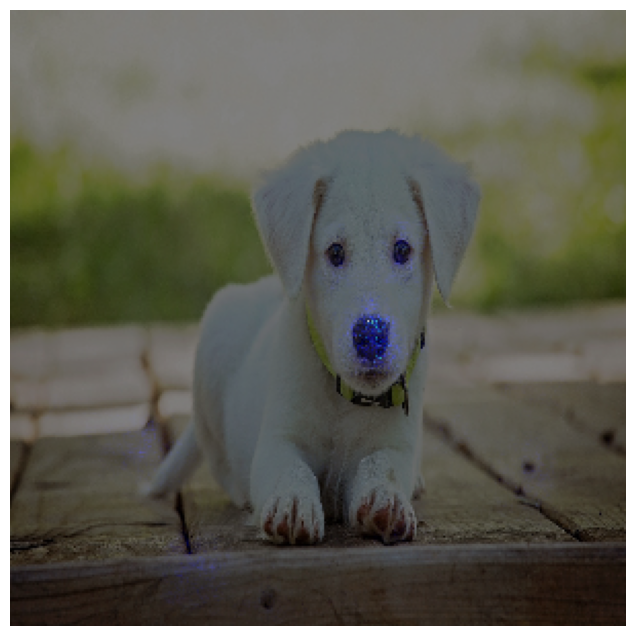

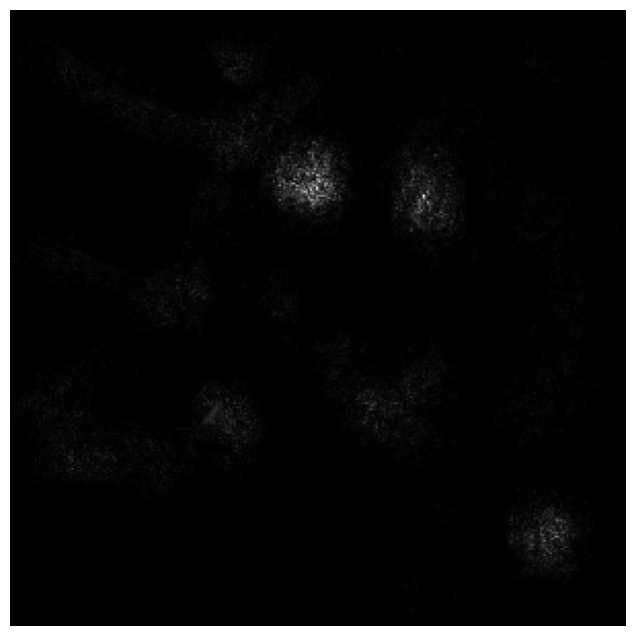

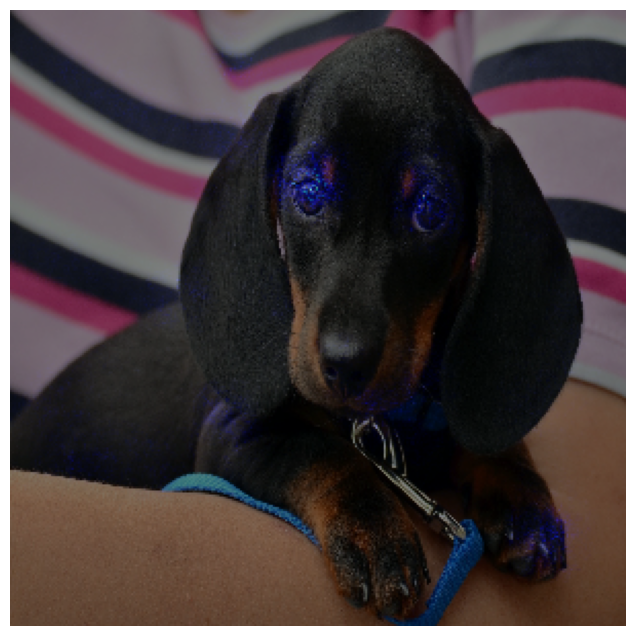

In [47]:
!wget --no-check-certificate 'https://docs.google.com/uc?export=download&id=14vFpBJsL_TNQeugX8vUTv8dYZxn__fQY' -O 95_epochs.h5

model.load_weights('95_epochs.h5')

do_salience('cat1.jpg', model, 0, "epoch95_salient")
do_salience('cat2.jpg', model, 0, "epoch95_salient")
do_salience('catanddog.jpg', model, 0, "epoch95_salient")
do_salience('dog1.jpg', model, 1, "epoch95_salient")
do_salience('dog2.jpg', model, 1, "epoch95_salient")